___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN<br><br>KC House Data<br><h1>

We will be using a dataset from Kaggle:

https://www.kaggle.com/harlfoxem/housesalesprediction

**Feature Columns:**
    
1. id - Unique ID for each home sold
2. date - Date of the home sale
3. price - Price of each home sold
4. bedrooms - Number of bedrooms
5. bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
6. sqft_living - Square footage of the apartments interior living space
7. sqft_lot - Square footage of the land space
8. floors - Number of floors
9. waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
10. view - An index from 0 to 4 of how good the view of the property was
11. condition - An index from 1 to 5 on the condition of the apartment,
12. grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
13. sqft_above - The square footage of the interior housing space that is above ground level
14. sqft_basement - The square footage of the interior housing space that is below ground level
15. yr_built - The year the house was initially built
16. yr_renovated - The year of the house’s last renovation
17. zipcode - What zipcode area the house is in
18. lat - Lattitude
19. long - Longitude
20. sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
21. sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

# Keras Regression

In [1]:
try:
    import jupyter_black
    jupyter_black.load()
except ImportError:
    print('You can safely ignore this.')

You can safely ignore this.


In [2]:
import os

# Set tensorflow log level to ignore INFOs.
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "1"

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style("whitegrid")
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Uncomment the following lines if you want to suppress warnings:
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Set it to None to display all rows in the dataframe:
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe:
pd.set_option("display.max_columns", None)

In [4]:
# Get python version
!python --version

Python 3.11.11


In [5]:
# Get tensorflow version
import tensorflow as tf

tf.__version__

'2.18.0'

In [6]:
# List cuda-capable gpu's that are attached to this session
if tf.config.list_physical_devices("GPU"):
    print("GPU support is enabled for this session.")
else:
    print("This session will run on CPU.")

GPU support is enabled for this session.


In [7]:
# Get more information about gpu (if available)
if tf.config.list_physical_devices("GPU"):
    !nvidia-smi

Thu Feb 20 08:07:49 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [8]:
!pip install folium  # Python library used for visualizing geospatial data on interactive maps
# !conda install folium -c conda-forge
# Conda is preferred

In [9]:
# If importing data from google drive, import drive from google.colab and mount your drive to the session
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
# Make sure the provide the correct path if drive is mounted
df = pd.read_csv("/content/drive/MyDrive/kc_house_data.csv")

In [19]:
# when working on local
path = "kc_house_data.csv"
df = pd.read_csv(path)

In [ ]:
# from matplotlib import style
# style.use('dark_background')

## Exploratory Data Analysis and Visualization

In [11]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [13]:
df.isnull().sum().any()

False

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### id_number

In [15]:
df = df.drop("id", axis=1)

### price

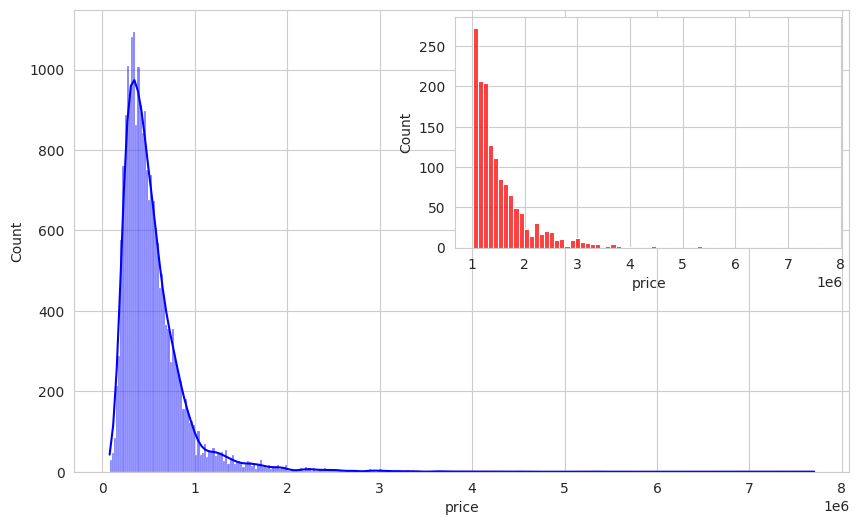

In [16]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, ax = plt.subplots(figsize=(10, 6))

# Create the original histogram
sns.histplot(df["price"], kde=True, color="b", ax=ax)

# Create the inset axes
axins = inset_axes(ax, width="50%", height="50%", loc="upper right")

# Create the zoomed histogram on the inset axes
sns.histplot(df[df["price"] > 1000000], x="price", color="r", ax=axins)
# axins.set_xlim(0, 5000)
# axins.set_ylim(0, 1000)

plt.show()

In [17]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


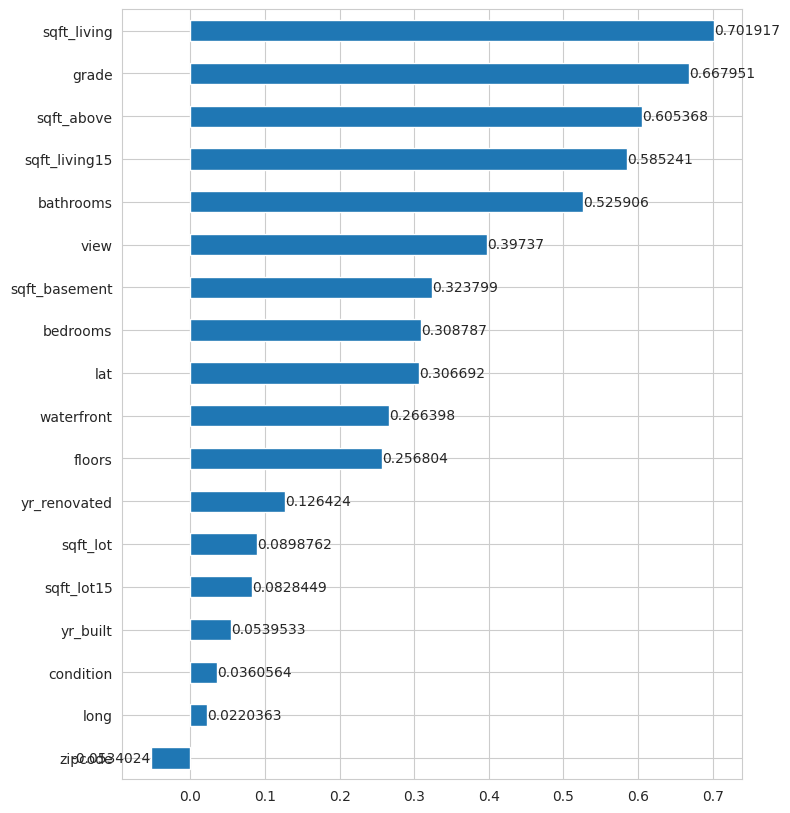

In [18]:
plt.figure(figsize=(8, 10))
ax = df.corr(numeric_only=True)["price"].sort_values().drop("price").plot(kind="barh")
ax.bar_label(ax.containers[0])
plt.show()

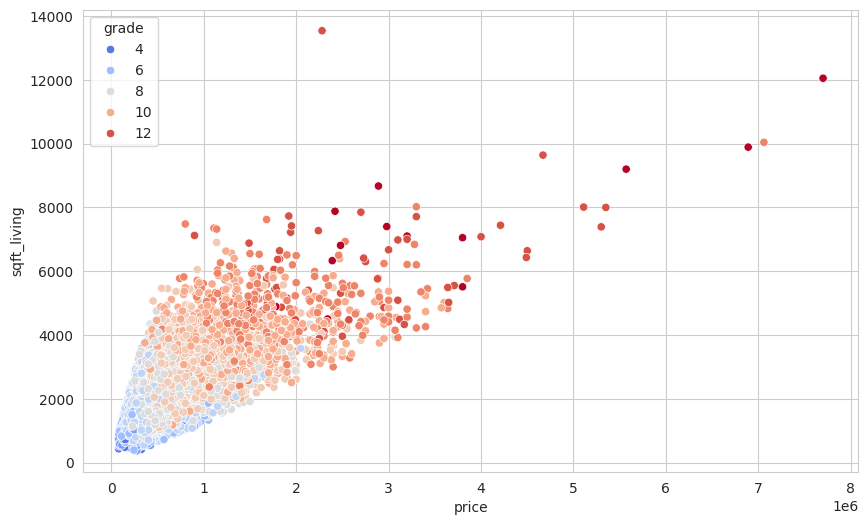

In [19]:
sns.scatterplot(x="price", y="sqft_living", data=df, hue="grade", palette="coolwarm")
plt.show()

### bedrooms

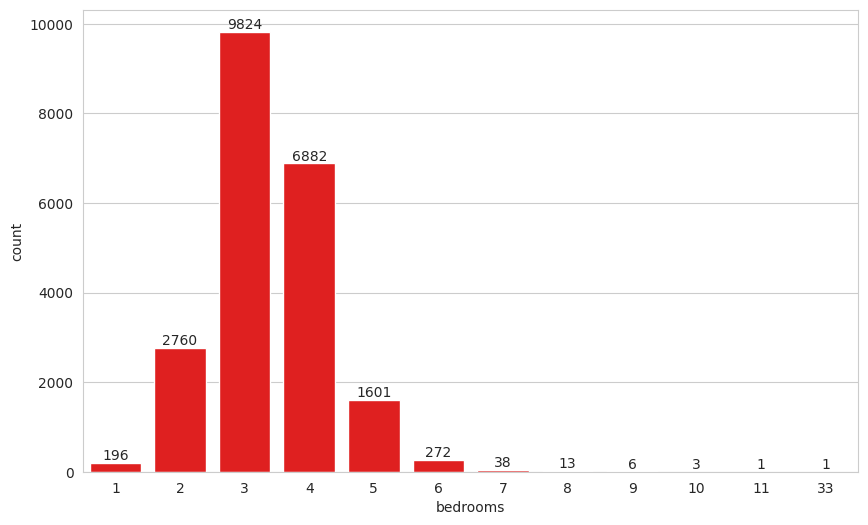

In [20]:
ax = sns.countplot(x=df["bedrooms"], color="r")
ax.bar_label(ax.containers[0])
plt.show()

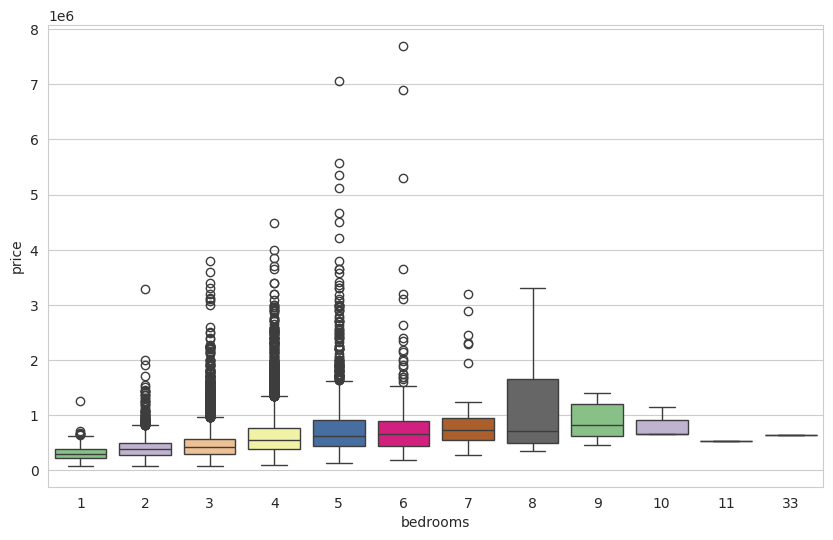

In [21]:
sns.boxplot(x="bedrooms", y="price", data=df, palette="Accent")
plt.show()

In [22]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [23]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [24]:
df.shape

(21596, 20)

### date

In [25]:
df["date"].dtype

dtype('O')

In [26]:
df["date"] = pd.to_datetime(df["date"])

In [27]:
df["date"]

,date
0,2014-10-13
1,2014-12-09
2,2015-02-25
3,2014-12-09
4,2015-02-18
...,...
21592,2014-05-21
21593,2015-02-23
21594,2014-06-23
21595,2015-01-16


In [28]:
df["year"] = df["date"].dt.year
# df['year'] = df['date'].apply(lambda date: date.year)
# Avoid using the apply method as it is almost 14x slower.

In [29]:
%%timeit
df["date"].dt.year

1.06 ms ± 36.3 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [30]:
%%timeit
df["date"].apply(lambda date: date.year)

20.5 ms ± 3.25 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [31]:
df["month"] = df["date"].dt.month

In [32]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


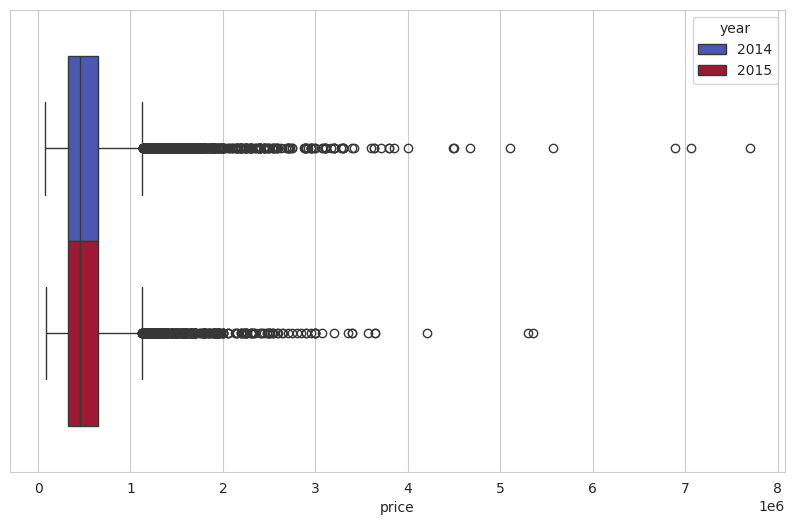

In [33]:
sns.boxplot(x="price", hue="year", data=df, palette="coolwarm")
plt.show()

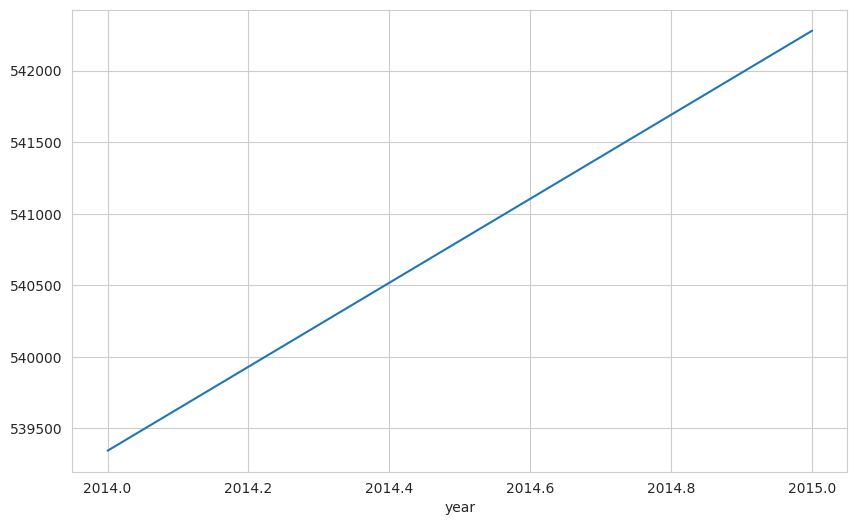

In [34]:
df.groupby("year")["price"].mean().plot()
plt.show()

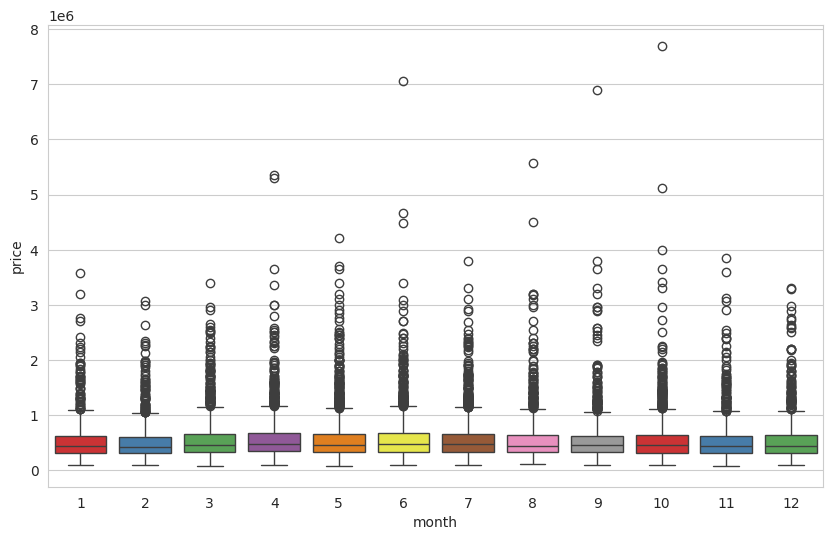

In [35]:
sns.boxplot(x="month", y="price", data=df, palette="Set1")
plt.show()

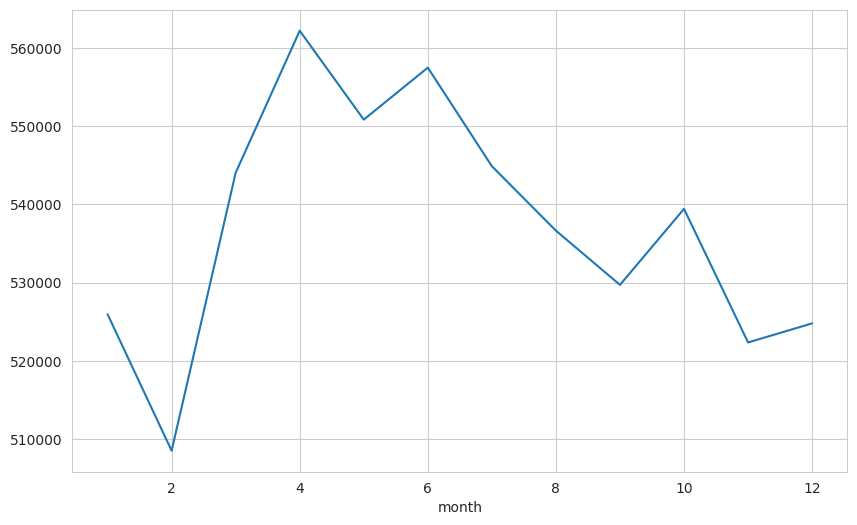

In [45]:
df.groupby("month")["price"].mean().plot()
plt.show()

In [36]:
df = df.drop(["date", "year", "month"], axis=1)

### zipcode

In [37]:
df["zipcode"].value_counts(dropna=False)

,count
zipcode,
98103,601
98038,589
98115,583
98052,574
98117,553
...,...
98102,104
98010,100
98024,80


If you want to keep zipcodes, look into [hash encoding](https://medium.com/flutter-community/dealing-with-categorical-features-with-high-cardinality-feature-hashing-7c406ff867cb).

In [38]:
df = df.drop("zipcode", axis=1)

### yr_renovated & yr_built

In [39]:
df["yr_renovated"].value_counts(dropna=False)

,count
yr_renovated,
0,20682
2014,91
2013,37
2003,36
2005,35
...,...
1954,1
1951,1
1959,1


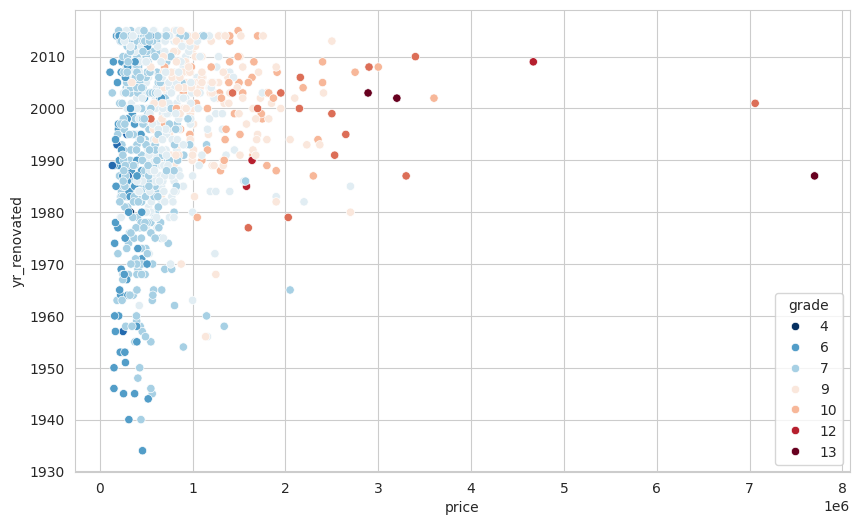

In [40]:
sns.scatterplot(x="price", y="yr_renovated", data=df[df.yr_renovated != 0], hue="grade", palette="RdBu_r")
plt.show()

In [41]:
df["yr_built"].value_counts(dropna=False)

,count
yr_built,
2014,559
2006,453
2005,450
2004,433
2003,420
...,...
1933,30
1901,29
1902,27


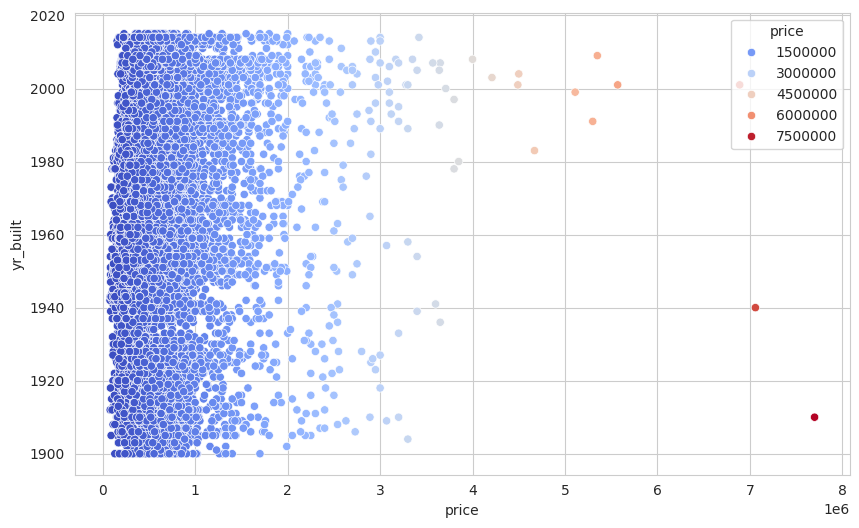

In [42]:
sns.scatterplot(x="price", y="yr_built", hue="price", data=df, palette="coolwarm")
plt.show()


In [43]:
df.yr_renovated.apply(lambda x: x if x == 0 else 1).value_counts()

,count
yr_renovated,
0,20682
1,914


In [44]:
df["renovated"] = df.yr_renovated.apply(lambda x: x if x == 0 else 1)

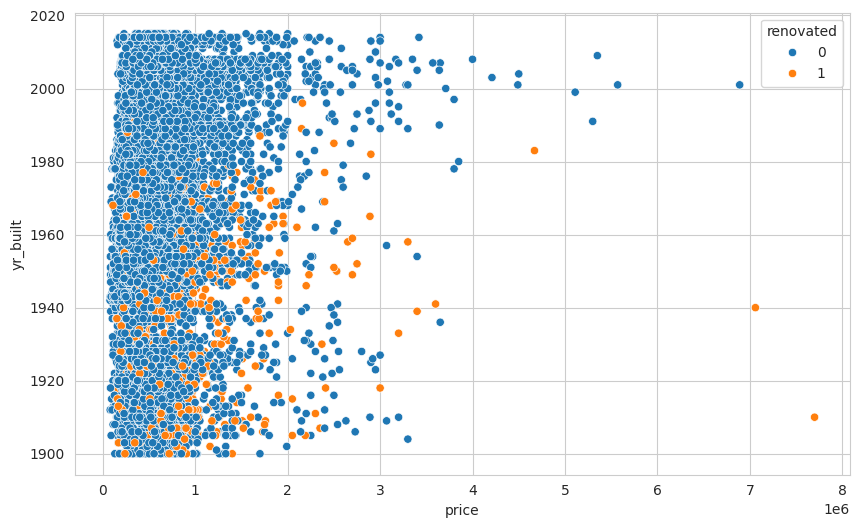

In [45]:
sns.scatterplot(x="price", y="yr_built", data=df, hue="renovated")
plt.show()

In [47]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
df["built|renovated"]

,built|renovated
0,1955.000
1,1991.000
2,1933.000
3,1965.000
4,1987.000
...,...
21592,2009.000
21593,2014.000
21594,2009.000
21595,2004.000


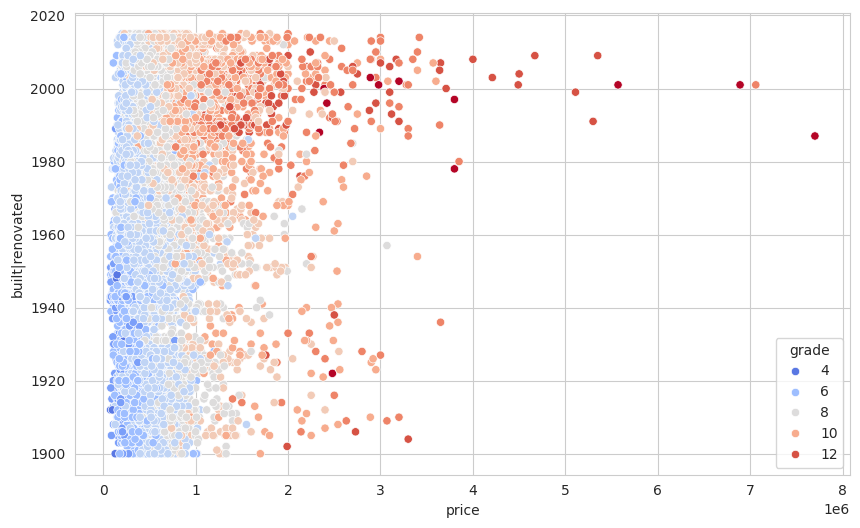

In [48]:
sns.scatterplot(x="price", y="built|renovated", data=df, hue="grade", palette="coolwarm")
plt.show()

In [49]:
df.drop(["yr_renovated", "yr_built", "renovated"], axis=1, inplace=True)

### sqft_basement

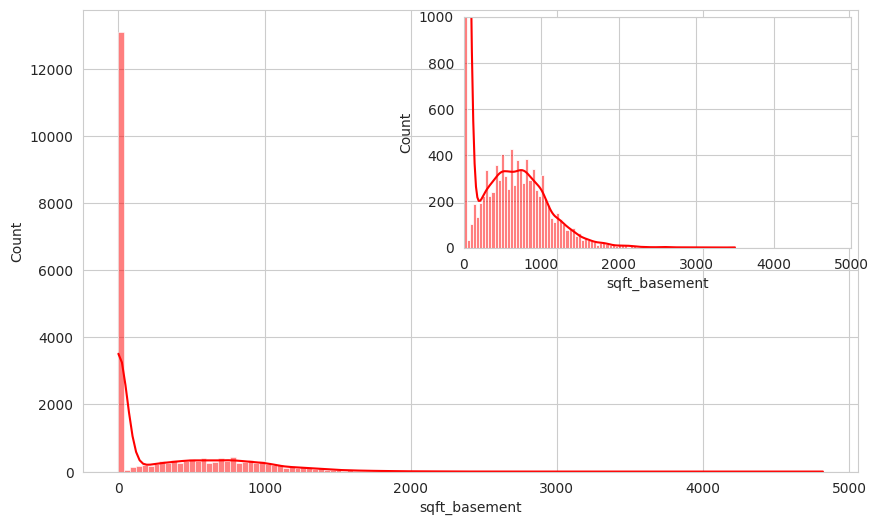

In [50]:
fig, ax = plt.subplots(figsize=(10, 6))

# Create the original histogram
sns.histplot(df["sqft_basement"], kde=True, color="r", ax=ax)

# Create the inset axes
axins = inset_axes(ax, width="50%", height="50%", loc="upper right")

# Create the zoomed histogram on the inset axes
sns.histplot(df[df["sqft_basement"] < 4000], x="sqft_basement", kde=True, color="r", ax=axins)
axins.set_xlim(0, 5000)
axins.set_ylim(0, 1000)

plt.show()


In [51]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000


### sqft_above

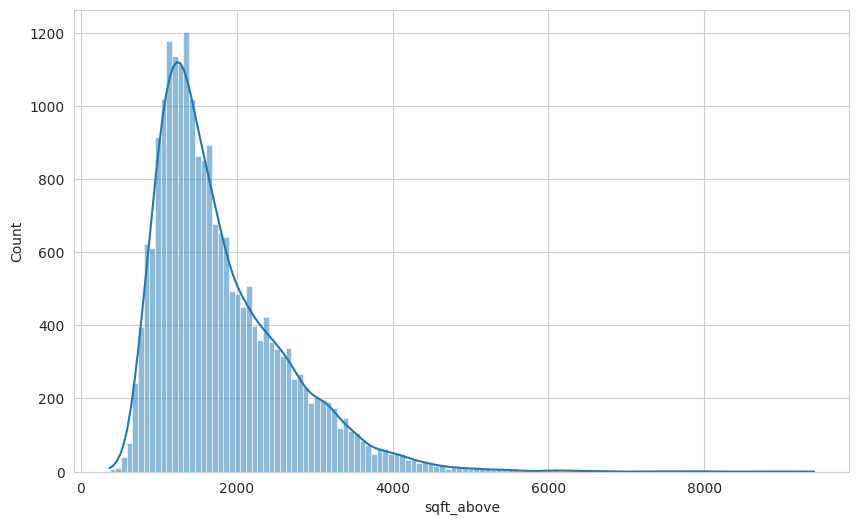

In [52]:
sns.histplot(df["sqft_above"], kde=True)
plt.show()

In [53]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

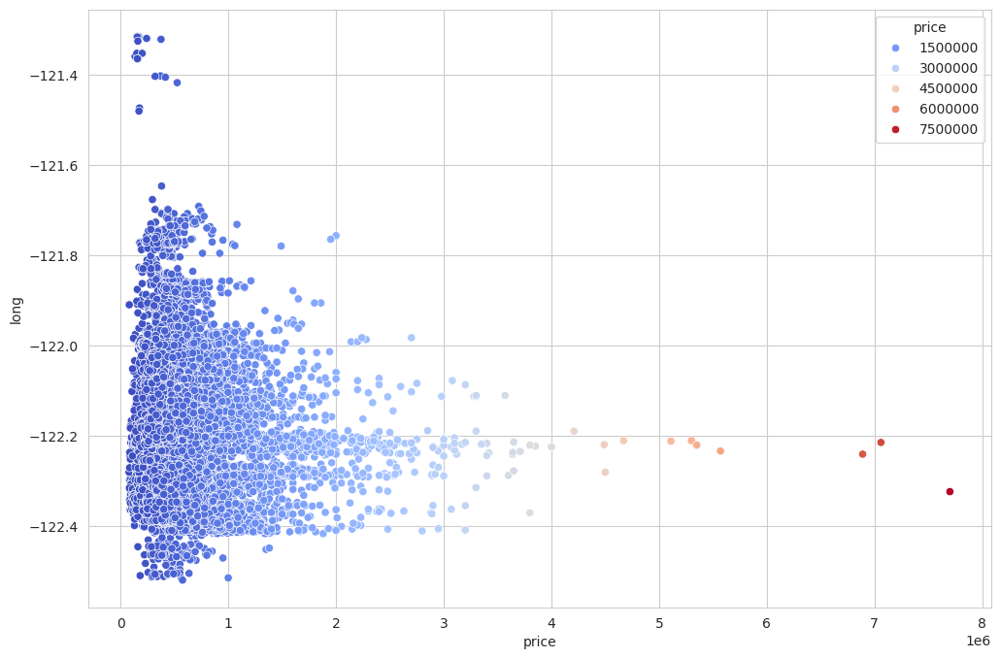

In [66]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="price", y="long", hue="price", data=df, palette="coolwarm")
plt.show()

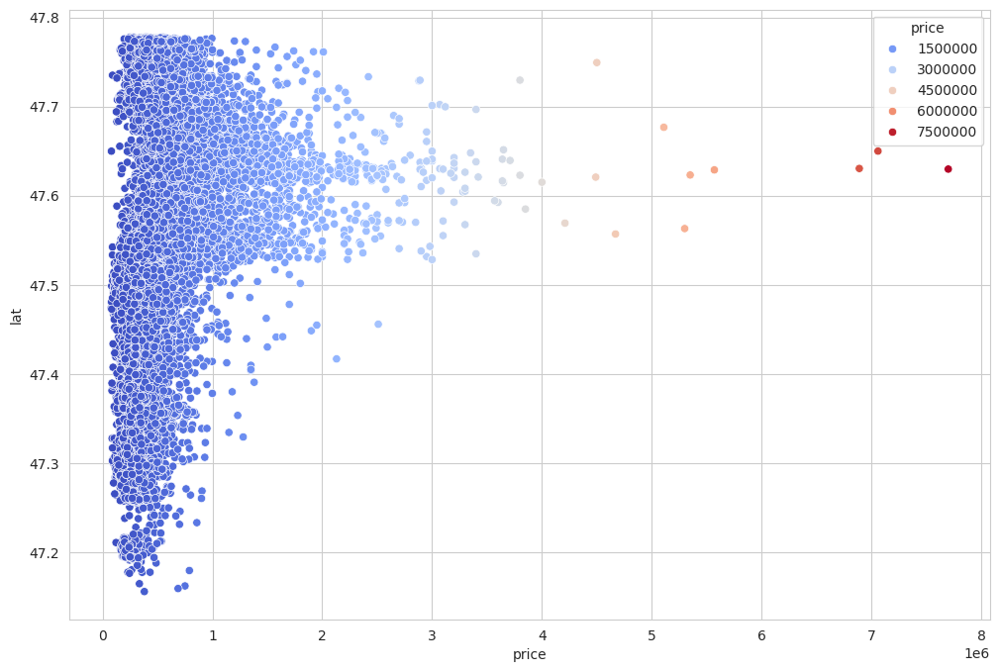

In [67]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="price", y="lat", hue="price", data=df, palette="coolwarm")
plt.show()

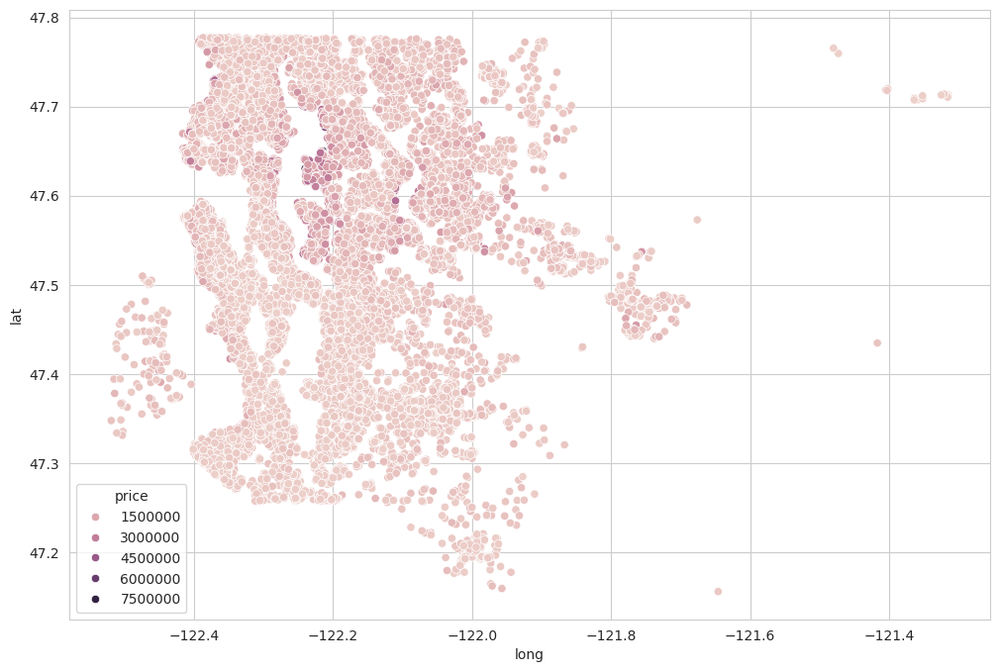

In [68]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="long", y="lat", data=df, hue="price")
plt.show()

In [69]:
# We will exclude the top 1% of most expensive houses from our visualisation.
len(df) * (0.01)

215.96

In [70]:
df.sort_values("price", ascending=False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
6329,1970000.000,4,3.500,4370,8510,2.000,0,1,3,10,3610,760,47.588,-122.204,2960,10347,2003.000


In [59]:
non_top_1_perc = df.sort_values("price", ascending=False).iloc[216:]

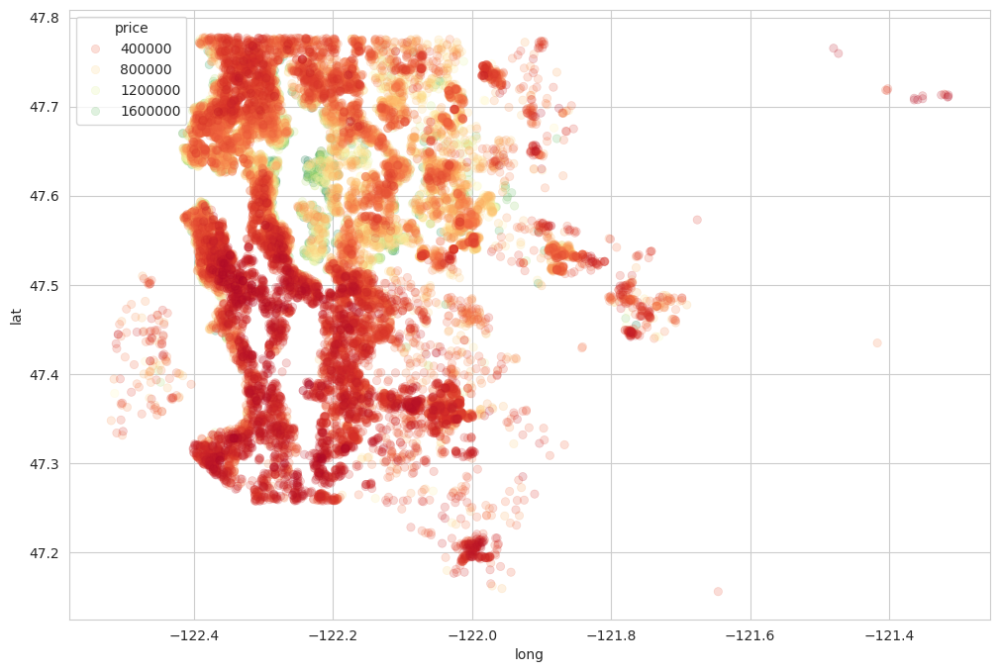

In [71]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="long",
    y="lat",
    data=non_top_1_perc,
    hue="price",
    palette="RdYlGn",
    edgecolor=None,
    alpha=0.2,
)
plt.show()

In [72]:
import folium
import branca.colormap as cm  # used for change colour

In [73]:
# The default location for our map is the mean valus of the "lat" and "long" values.
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [74]:
# Creating bins for price ranges to derive colours off of.
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [75]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)
colormap = cm.StepColormap(
    colors=["red", "orange", "yellow", "green"],
    index=[step_1, step_2, step_3, step_4, step_5],
    vmin=step_1,
    vmax=step_5,
)
for loc, p in zip(zip(df["lat"], df["long"]), df["price"]):
    folium.Circle(location=loc, radius=1, fill=True, color=colormap(p)).add_to(m)
m

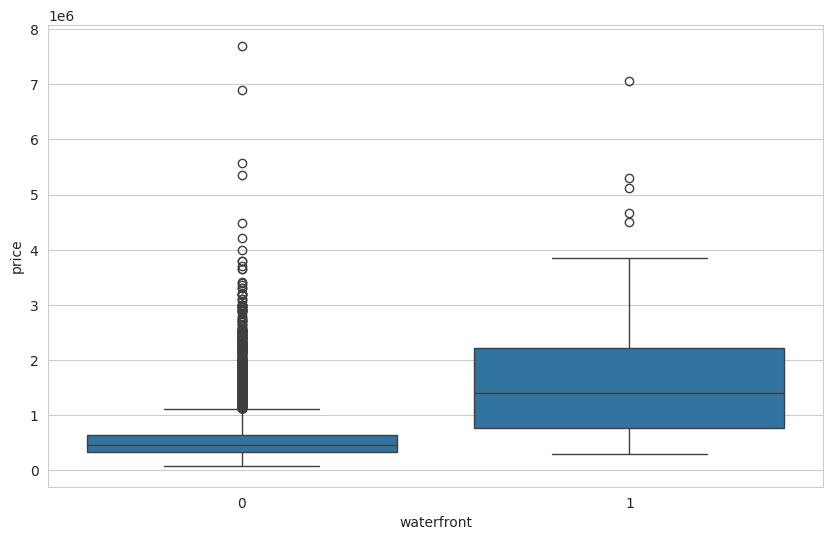

In [76]:
sns.boxplot(x="waterfront", y="price", data=df)
plt.show()

In [77]:
df.groupby("waterfront").price.mean()

,price
waterfront,
0,531757.274
1,1662524.184


### latest data

In [78]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [79]:
df.shape

(21596, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [80]:
from sklearn.model_selection import train_test_split

In [81]:
X = df.drop("price", axis=1)
y = df["price"]

In [82]:
import os

seed = 101
# "TF_DETERMINISTIC_OPS" to "1". This is a TensorFlow feature that, when a random seed is set,
# makes the operations deterministic (i.e., less random). This can also help with reproducibility.
os.environ["TF_DETERMINISTIC_OPS"] = "1"
# 'tf.keras.utils.set_random_seed' is a function that sets the random seed for TensorFlow.
# Here, we're using the seed value we set earlier. This means that the randomness
# in any TensorFlow operations will be determined by this seed, and so will be reproducible.
tf.keras.utils.set_random_seed(seed)

In [83]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=seed
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.15, random_state=seed
)

In [84]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [85]:
scaler = MinMaxScaler()

In [86]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [87]:
!pip install livelossplot

In [88]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from livelossplot import PlotLossesKerasTF

In [89]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

In [90]:
def eval_metric(actual, pred):
    """Prints regression metrics, calculated using the given
    actual and predicted target values.
    Args:
        actual (list): Actual target values.
        pred (list): Predicted target values.
    Returns:
        None
    """
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mape = mean_absolute_percentage_error(actual, pred)
    score = r2_score(actual, pred)
    print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse, "\nmape:", mape)

In [91]:
X_train.shape

(16520, 16)

In [92]:
model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
# model.add(Activation("relu"))
# Activation function can be added separately
# as a different line after each layer.
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

model.compile(optimizer="adam", loss="mean_squared_error")

In [93]:
# if you want to see the summary of the architecture before the fit process, you must define the input_dim
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 24)                  │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 24)                  │             600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 12)                  │             300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 6)                   │              78 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,393 (5.44 KB)

 Trainable params: 1,393 (5.44 KB)

 Non-trainable params: 0 (0.00 B)

In [94]:
# To display weights and biases of each layer
for i, weight in enumerate(model.weights):
    print(f"Weight {i}:")
    print(weight.numpy(), "\n")

Weight 0:
[[-0.35647073  0.38490498 -0.08744469  0.15377373  0.22215843 -0.02771163
   0.11982757 -0.35179138 -0.22738509 -0.01394773  0.37500745  0.17092556
  -0.33209184  0.32572126  0.04000178  0.28462964 -0.04399332  0.19303006
   0.24007684 -0.07156605 -0.07338411 -0.26527756 -0.10138947 -0.12765884]
 [ 0.20285243  0.1625874   0.09493753  0.210621   -0.3477749   0.04268652
   0.24083078 -0.3537471  -0.37514928  0.31485617 -0.10756519  0.02557248
   0.0060361   0.10938206 -0.04046023  0.38605756  0.05352944  0.2004916
   0.16421968 -0.09854421  0.27363658  0.14958262 -0.26525187 -0.17038073]
 [-0.14781646  0.22237402 -0.25978014 -0.08758965 -0.01525185 -0.27800336
   0.36590946 -0.04418713  0.21475899 -0.20625347 -0.21336366 -0.06695104
  -0.19746223 -0.03350914  0.27873516  0.07029167 -0.19808385 -0.05061477
   0.11886674  0.25072682 -0.36691827 -0.36778718 -0.05691609  0.14560783]
 [-0.13458556  0.23913866  0.05025178 -0.35281578 -0.2878821  -0.27039498
   0.33782828  0.10401911 

In [98]:
epoch = 1000
batch_size = 128
patience = 25
lr = 0.003

(16520, 16)


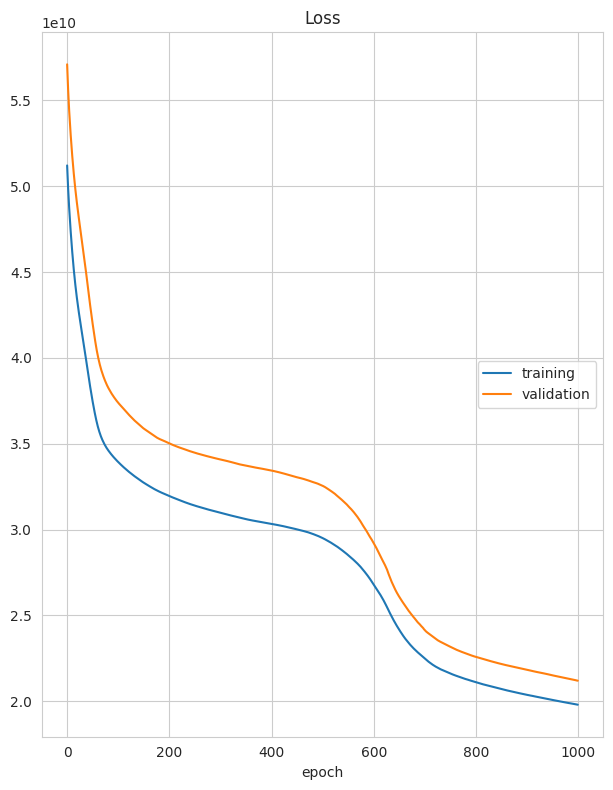

Loss
	training         	 (min: 19798966272.000, max: 51208966144.000, cur: 19798966272.000)
	validation       	 (min: 21197813760.000, max: 57097662464.000, cur: 21197813760.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 19153551360.0000 - val_loss: 21197813760.0000


In [97]:
# placing the model specifically on the GPU is usually unnecessary because it is done automatically
with tf.device('/GPU:0'):
  model.fit(x=X_train,
          y=y_train,
          validation_data=(X_val, y_val),
          batch_size=batch_size,
          epochs=epoch,
          callbacks=[PlotLossesKerasTF()])

In [95]:
# To display weights and biases of each layer
for i, weight in enumerate(model.weights):
    print(f"Weight {i}:")
    print(weight.numpy(), "\n")

Weight 0:
[[-4.82730627e-01 -1.87434360e-01  3.51934046e-01 -9.03223753e-01
   4.31056976e-01 -2.77116299e-02 -4.83158454e-02 -6.11833453e-01
  -3.64810467e-01 -2.60083407e-01 -5.29243231e-01 -3.25408965e-01
  -1.38961935e+00  1.71923097e-02 -6.19670630e-01 -3.38841885e-01
  -4.39933240e-02 -2.16364101e-01 -8.61892924e-02 -1.09272110e+00
  -7.41716623e-01  1.11250091e+00 -2.81035095e-01 -1.80266157e-01]
 [ 6.54339552e-01  3.20072651e-01 -5.92671573e-01  9.27067101e-01
   6.07452691e-01  4.26865220e-02  6.51090324e-01 -8.43998045e-03
   1.17316701e-01  6.91193342e-01  2.12550926e+00  1.98900783e+00
   1.76348305e+00  1.37850344e+00  7.89814651e-01  1.50667441e+00
   5.35294414e-02  1.37315917e+00  9.90117043e-02  2.75579023e+00
   2.29642844e+00  1.51662588e+00  1.09712608e-01 -2.19555005e-01]
 [ 1.84328091e+00  1.81884634e+00  6.96177840e-01  1.68598187e+00
   1.77652168e+00 -2.78003365e-01  2.37059283e+00  2.00809455e+00
   2.29027057e+00  1.79938602e+00  3.21347308e+00  2.09270358e+0

In [99]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,51208966144.000,57097662464.000
1,50483838976.000,56289169408.000
2,49841127424.000,55582605312.000
3,49261318144.000,54956261376.000
4,48731668480.000,54396444672.000
...,...,...
995,19819462656.000,21225089024.000
996,19816800256.000,21215395840.000
997,19808251904.000,21208637440.000
998,19804964864.000,21204891648.000


<Axes: >

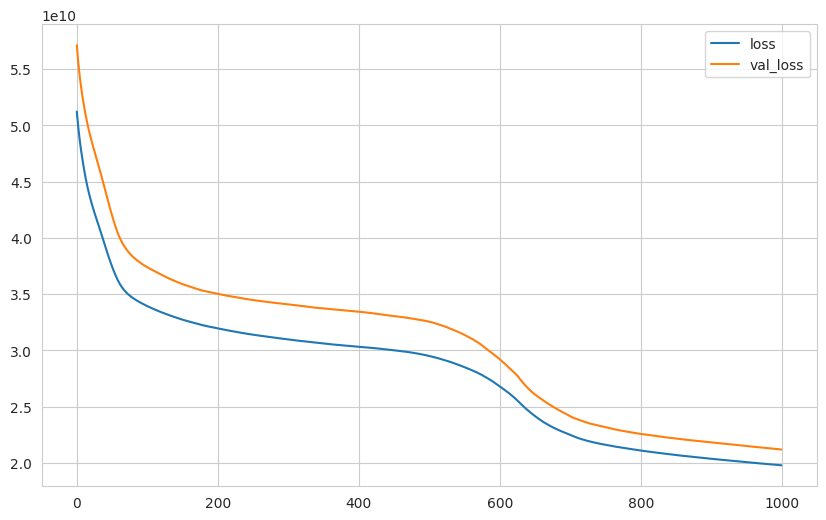

In [100]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [101]:
model.evaluate(X_test, y_test, verbose=0)

17875251200.0

In [102]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.8601894490401507 
mae: 80959.20883969907 
mse: 17962826303.62253 
rmse: 134025.4688617896 
mape: 0.15519451847035184


### learning_rate

In [104]:
from tensorflow.keras.optimizers import Adam

0.003


In [ ]:
model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=lr)  # default learning rate value is 0.001
model.compile(optimizer=opt, loss="mean_squared_error")

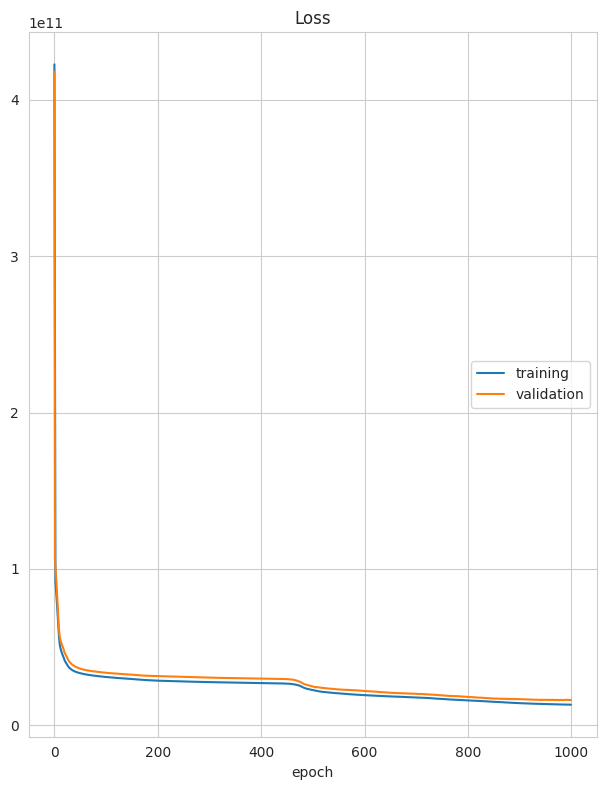

Loss
	training         	 (min: 13081853952.000, max: 422807044096.000, cur: 13081853952.000)
	validation       	 (min: 15972408320.000, max: 418083405824.000, cur: 16080614400.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 12658132992.0000 - val_loss: 16080614400.0000


In [ ]:
model.fit(x=X_train,
          y=y_train,
          validation_data=(X_val, y_val),
          batch_size=batch_size,
          epochs=epoch,
          callbacks=[PlotLossesKerasTF()])

<Axes: >

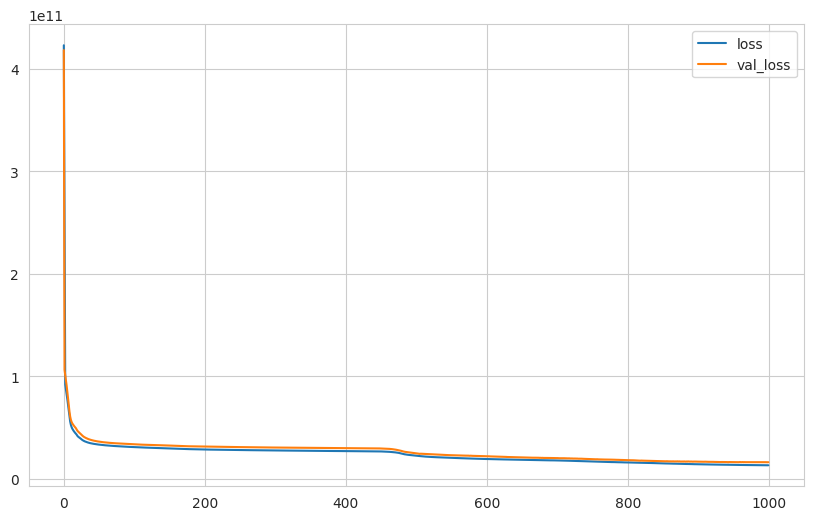

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.8921832837945219 
mae: 72488.33088107638 
mse: 13852266030.924566 
rmse: 117695.65000850527 
mape: 0.1406905897652404


### EarlyStopping

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mean_squared_error")

In [ ]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=patience, restore_best_weights=True
)

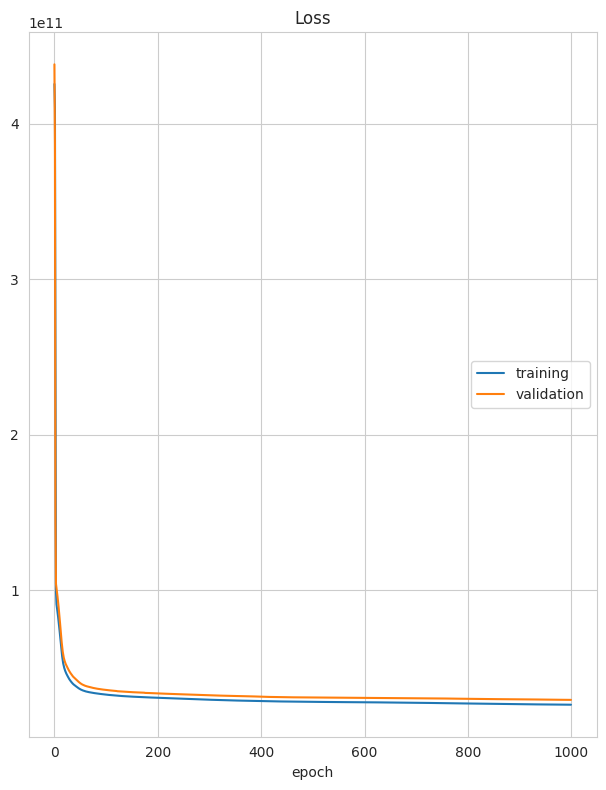

Loss
	training         	 (min: 26194915328.000, max: 425736175616.000, cur: 26194915328.000)
	validation       	 (min: 29302892544.000, max: 438385442816.000, cur: 29302892544.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 25225963520.0000 - val_loss: 29302892544.0000
Restoring model weights from the end of the best epoch: 1000.


In [ ]:
model.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_val, y_val),
    batch_size=batch_size,
    epochs=epoch,
    callbacks=[early_stop, PlotLossesKerasTF()],
)

<Axes: >

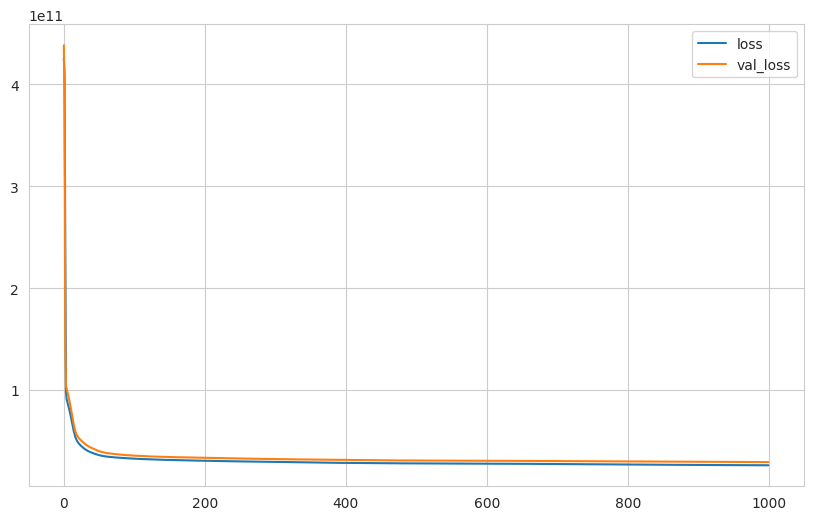

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.8238379401984481 
mae: 93822.86695601852 
mse: 22633259505.66052 
rmse: 150443.54258545136 
mape: 0.18300462713917703


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [ ]:
from tensorflow.keras.layers import Dropout

In [ ]:
# tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(24, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(12, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(6, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mean_squared_error")

In [ ]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=patience, restore_best_weights=True
)

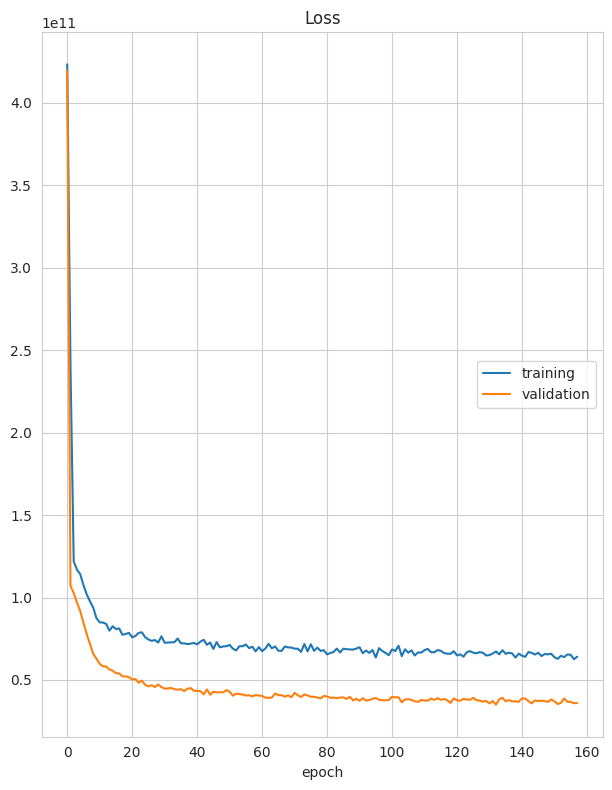

Loss
	training         	 (min: 62596411392.000, max: 423403356160.000, cur: 64091201536.000)
	validation       	 (min: 34983813120.000, max: 419532013568.000, cur: 35995688960.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 63481262080.0000 - val_loss: 35995688960.0000
Epoch 158: early stopping
Restoring model weights from the end of the best epoch: 133.


In [ ]:
model.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_val, y_val),
    batch_size=batch_size,
    epochs=epoch,
    callbacks=[early_stop, PlotLossesKerasTF()],
)

<Axes: >

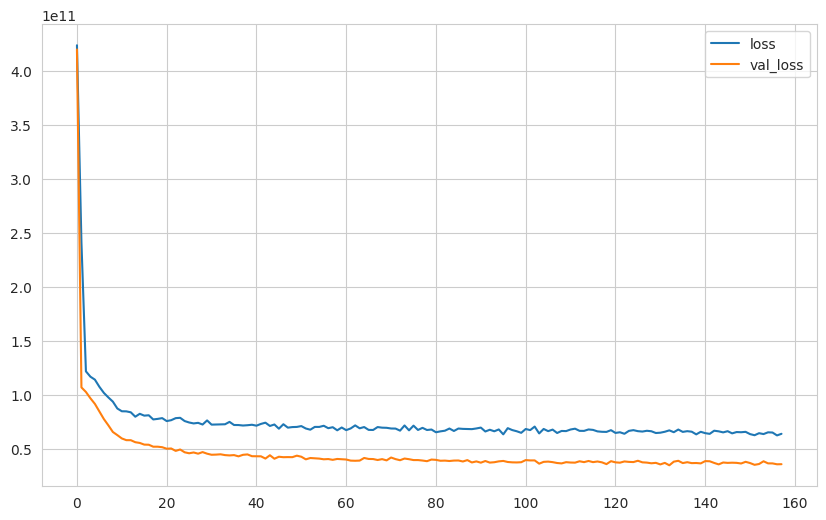

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.7826939466522169 
mae: 102427.79435040509 
mse: 27919430001.62374 
rmse: 167091.0829506582 
mape: 0.1914008593621454


## Saving Final Model and Scaler

In [ ]:
import pickle

pickle.dump(scaler, open("scaler_kc_house", "wb"))

In [ ]:
# tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mean_squared_error")

In [ ]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=100, restore_best_weights=True
)

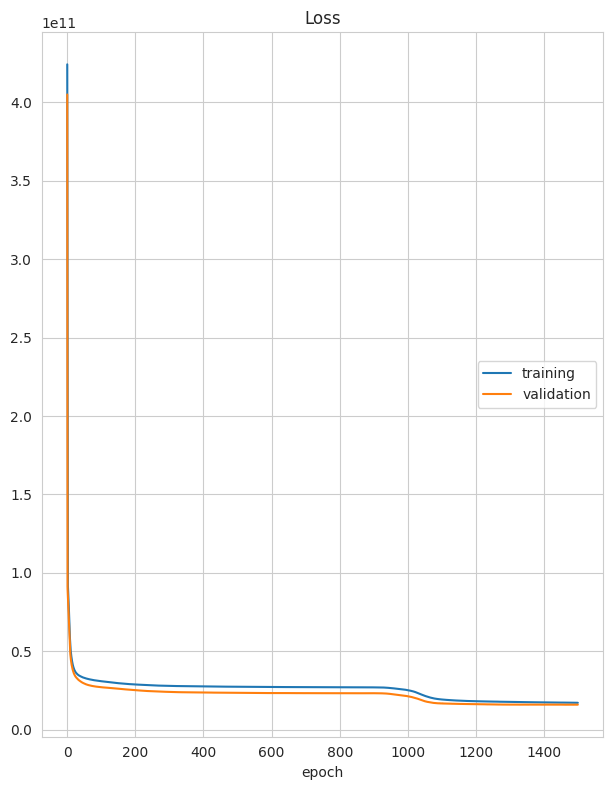

Loss
	training         	 (min: 17117113344.000, max: 424287240192.000, cur: 17117113344.000)
	validation       	 (min: 15903349760.000, max: 405063696384.000, cur: 15939590144.000)
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 16629025792.0000 - val_loss: 15939590144.0000
Restoring model weights from the end of the best epoch: 1467.


In [ ]:
model.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_test, y_test),
    batch_size=128,
    epochs=1500,
    callbacks=[early_stop, PlotLossesKerasTF()],
)

<Axes: >

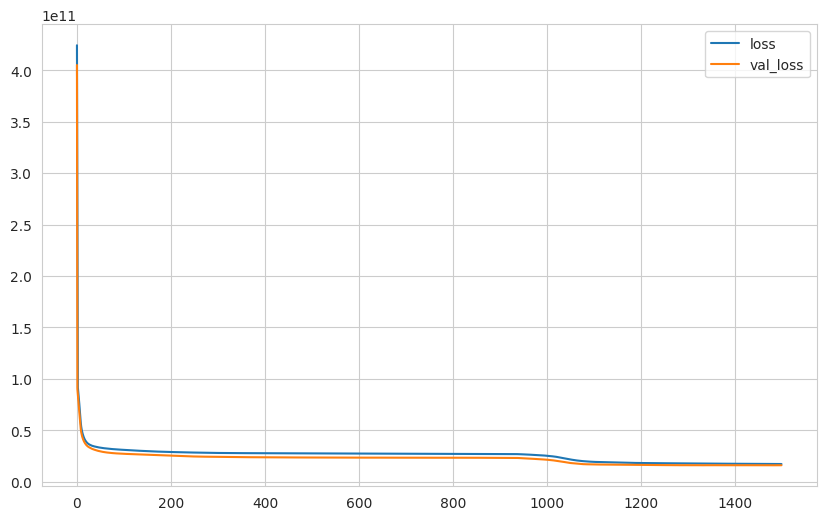

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
y_pred = model.predict(X_test)

68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


In [ ]:
eval_metric(y_test, y_pred)

r2_score: 0.87621902560542 
mae: 78638.52983940972 
mse: 15903350122.563503 
rmse: 126108.4855295769 
mape: 0.15071002359925373


In [ ]:
model.save("model_kc_house.keras")  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
model_kc_house = load_model("model_kc_house.keras")
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [ ]:
single_house = df.drop("price", axis=1).iloc[[0], :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [ ]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.0030592 , 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.57149751, 0.21760797, 0.15304348, 0.00891317,
        0.47826087]])

In [ ]:
model_kc_house.predict(single_house)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


array([[268318.72]], dtype=float32)

In [ ]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)

# Prediction
y_pred = ln_model.predict(X_test)
y_pred_train = ln_model.predict(X_train)

# Evaluation
eval_metric(y_test, y_pred)
print("-*" * 15)
eval_metric(y_train, y_pred_train)

r2_score: 0.7053689249888626 
mae: 124318.09642473492 
mse: 37854130376.7161 
rmse: 194561.37945829873 
mape: 0.25266493041628885
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
r2_score: 0.6856343910577014 
mae: 128435.50437950132 
mse: 41976651679.47364 
rmse: 204882.04333097042 
mape: 0.2577976734600313


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_model = RandomForestRegressor(random_state=seed)
rf_model.fit(X_train, y_train)

# Predict
y_pred = rf_model.predict(X_test)
y_pred_train = rf_model.predict(X_train)

# Evaluate
eval_metric(y_test, y_pred)
print("-*" * 15)
eval_metric(y_train, y_pred_train)

r2_score: 0.8794303888067189 
mae: 66615.09369980158 
mse: 15490754942.966911 
rmse: 124461.86139925319 
mape: 0.12471803944891194
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
r2_score: 0.981856881716994 
mae: 26363.45309779056 
mse: 2422616644.06496 
rmse: 49220.08374703318 
mape: 0.04962088272626225


___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___